In [124]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
bs = 32 # batch size
version = 3.1

In [125]:
!pip install -Uqq fastai

In [126]:
from fastai import *
from fastai.vision.all import *
from fastai.vision.widgets import *

In [127]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [128]:
%cd /content/drive/My Drive/Capstone projects/Vehicle Recognizer

/content/drive/My Drive/Capstone projects/Vehicle Recognizer


In [129]:
data_path = "data"
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files,                        
    splitter=RandomSplitter(valid_pct=0.1, seed=42),  
    get_y=parent_label,                               
    item_tfms=Resize(256))                            

In [130]:
dblock = dblock.new(item_tfms=RandomResizedCrop(256, min_scale=0.5), batch_tfms=aug_transforms())
dls = dblock.dataloaders(data_path, bs = bs) 
torch.save(dls, f"vehicles_dataloader_v{version}.pkl")

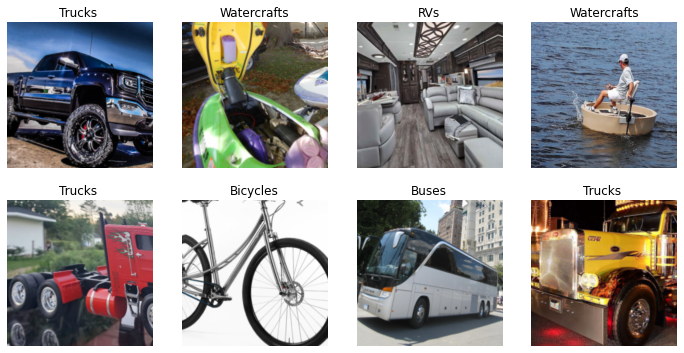

In [131]:
dls.train.show_batch(max_n=8, nrows=2)

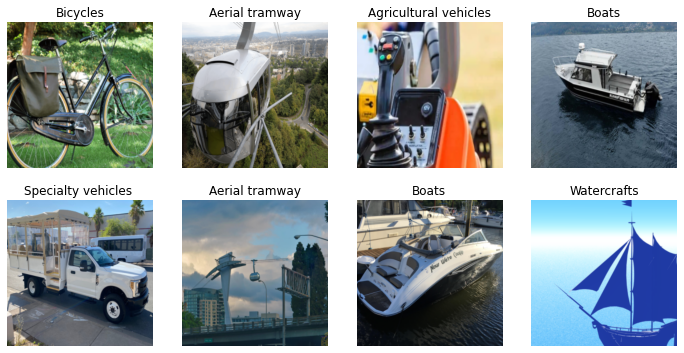

In [132]:
dls.valid.show_batch(max_n=8, nrows=2)

## Training model

In [133]:
model_path = "models"

In [134]:
model = vision_learner(dls, densenet169 , metrics=[error_rate,accuracy])

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet169_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet169_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [107]:
# model.fit_one_cycle(4)

In [135]:
model.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.168939,0.532734,0.154321,0.845679,03:32


/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.569534,0.481876,0.135802,0.864198,03:37
1,0.486196,0.507800,0.152263,0.847737,03:36
2,0.443364,0.467547,0.133745,0.866255,03:37
3,0.397289,0.467644,0.125514,0.874486,03:37
4,0.264041,0.509060,0.117284,0.882716,03:37
5,0.204967,0.501387,0.125514,0.874486,03:36
6,0.151228,0.495255,0.117284,0.882716,03:37
7,0.086663,0.469743,0.115226,0.884774,03:37
8,0.069194,0.463759,0.104938,0.895062,03:37
9,0.052296,0.450132,0.100823,0.899177,03:38


/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converte

In [109]:
# model.fit_one_cycle(2)

In [138]:
model.save(f"vehicles-recognizer-v{version}")

Path('models/vehicles-recognizer-v3.1.pth')

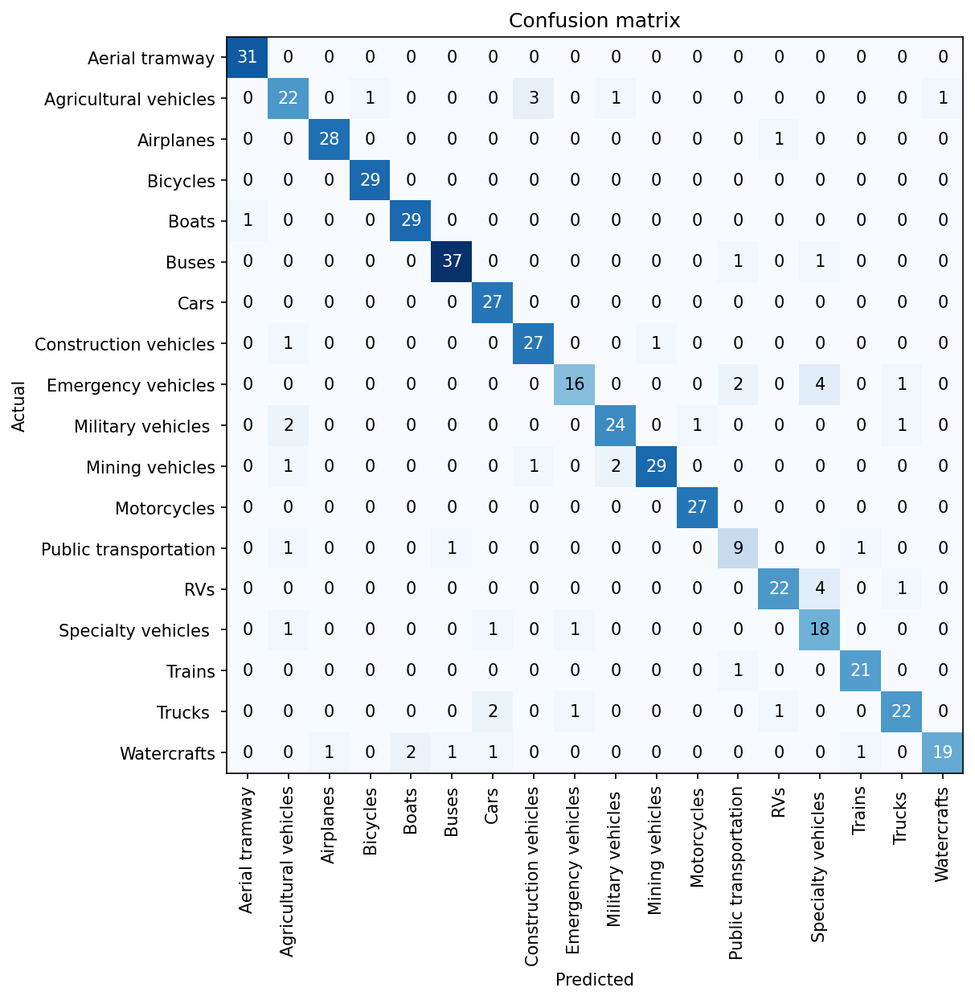

In [139]:
interp = ClassificationInterpretation.from_learner(model)
interp.plot_confusion_matrix(figsize=(8,10), dpi=150)

In [ ]:
interp.plot_top_losses(9, figsize=(15,11))

In [141]:
interp.most_confused(min_val=2)

[('Emergency vehicles', 'Specialty vehicles ', 4),
 ('RVs', 'Specialty vehicles ', 4),
 ('Agricultural vehicles', 'Construction vehicles', 3),
 ('Emergency vehicles', 'Public transportation', 2),
 ('Military vehicles ', 'Agricultural vehicles', 2),
 ('Mining vehicles', 'Military vehicles ', 2),
 ('Trucks ', 'Cars', 2),
 ('Watercrafts', 'Boats', 2)]

In [114]:
# model.load(f"vehicles-recognizer-v{version}")
# model.load(f"vehicles-recognizer-v0")


In [117]:
cleaner = ImageClassifierCleaner(model)
cleaner

/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/usr/local/lib/python3.8/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


In [123]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()                                    
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), f"{data_path}/{cat}") 

In [143]:
model.export(f"{model_path}/vehicles-recognizer-v{version}.pkl")